___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

In this project, you must apply EDA processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering will be challenges.

Also, this project aims to improve your ability to implement algorithms for Multi-Class Classification. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

# Determines

The 2012 US Army Anthropometric Survey (ANSUR II) was executed by the Natick Soldier Research, Development and Engineering Center (NSRDEC) from October 2010 to April 2012 and is comprised of personnel representing the total US Army force to include the US Army Active Duty, Reserves, and National Guard. In addition to the anthropometric and demographic data described below, the ANSUR II database also consists of 3D whole body, foot, and head scans of Soldier participants. These 3D data are not publicly available out of respect for the privacy of ANSUR II participants. The data from this survey are used for a wide range of equipment design, sizing, and tariffing applications within the military and has many potential commercial, industrial, and academic applications.

The ANSUR II working databases contain 93 anthropometric measurements which were directly measured, and 15 demographic/administrative variables explained below. The ANSUR II Male working database contains a total sample of 4,082 subjects. The ANSUR II Female working database contains a total sample of 1,986 subjects.


DATA DICT:
https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (body scales, and race characteristics) knowledge on the internet to get to know the data set in the fastest way. 

You will implement ***Logistic Regression, Support Vector Machine, XGBoost, Random Forest*** algorithms. Also, evaluate the success of your models with appropriate performance metrics.

At the end of the project, choose the most successful model and try to enhance the scores with ***SMOTE*** make it ready to deploy. Furthermore, use ***SHAP*** to explain how the best model you choose works.

# Tasks

#### 1. Exploratory Data Analysis (EDA)
- Import Libraries, Load Dataset, Exploring Data

    *i. Import Libraries*
    
    *ii. Ingest Data *
    
    *iii. Explore Data*
    
    *iv. Outlier Detection*
    
    *v.  Drop unnecessary features*

#### 2. Data Preprocessing
- Scale (if needed)
- Separete the data frame for evaluation purposes

#### 3. Multi-class Classification
- Import libraries
- Implement SVM Classifer
- Implement Decision Tree Classifier
- Implement Random Forest Classifer
- Implement XGBoost Classifer
- Compare The Models



# EDA
- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

## Import Libraries
Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [1]:
# libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf
#Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
#To display the plots
%matplotlib inline

# sklearn library for machine learning algorithms, data preprocessing, and evaluation
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.compose import make_column_transformer
from sklearn.metrics import make_scorer


# yellowbrick library for visualizing the model performance
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.cluster import KElbowVisualizer 

from sklearn.pipeline import Pipeline
# to get rid of the warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

## Ingest Data from links below and make a dataframe
- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

## Explore Data

In [2]:
df1=pd.read_csv("ANSUR II FEMALE Public.csv")
df2=pd.read_csv("ANSUR II MALE Public.csv", encoding="ISO-8859-1")

In [3]:
df1 = df1.rename(columns = {"SubjectId":"subjectid"})

In [4]:
df = pd.concat([df1,df2])

In [5]:
df

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10037,231,1282,301,204,1180,222,177,373,315,...,Combat Support,92Y,Germany,2,NaN,2,26,61,142,Right hand
1,10038,194,1379,320,207,1292,225,178,372,272,...,Combat Service Support,25U,California,3,Mexican,3,21,64,120,Right hand
2,10042,183,1369,329,233,1271,237,196,397,300,...,Combat Service Support,35D,Texas,1,NaN,1,23,68,147,Right hand
3,10043,261,1356,306,214,1250,240,188,384,364,...,Combat Service Support,25U,District of Columbia,8,Caribbean Islander,2,22,66,175,Right hand
4,10051,309,1303,308,214,1210,217,182,378,320,...,Combat Arms,42A,Texas,1,NaN,1,45,63,195,Right hand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4077,29442,235,1353,312,216,1263,228,193,384,318,...,Combat Arms,11B,Colorado,51,Blackfoot Cherokee Choctaw,1,22,67,160,Right hand
4078,29443,247,1473,336,234,1346,253,196,428,374,...,Combat Arms,91B,Oklahoma,1,NaN,1,22,71,194,Right hand
4079,29447,264,1394,313,227,1280,245,193,407,367,...,Combat Arms,13B,Oklahoma,1,NaN,1,23,67,186,Right hand
4080,29451,203,1417,327,223,1314,250,196,419,365,...,Combat Arms,13P,Oklahoma,1,NaN,1,22,69,165,Right hand


In [6]:
df.shape

(6068, 108)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6068 entries, 0 to 4081
Columns: 108 entries, subjectid to WritingPreference
dtypes: int64(99), object(9)
memory usage: 5.0+ MB


In [8]:
df.isnull().sum()

subjectid                         0
abdominalextensiondepthsitting    0
acromialheight                    0
acromionradialelength             0
anklecircumference                0
                                 ..
DODRace                           0
Age                               0
Heightin                          0
Weightlbs                         0
WritingPreference                 0
Length: 108, dtype: int64

In [9]:
df.isnull().sum().any()

True

In [10]:
df["Ethnicity"].isnull().sum()

4647

In [11]:
df = df.drop("Ethnicity", axis=1)

In [12]:
df.describe()

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,SubjectNumericRace,DODRace,Age,Heightin,Weightlbs
count,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.00000,6068.000000,6068.000000,6068.000000,...,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000
mean,20757.198418,246.468688,1406.161338,327.374423,224.891397,1299.608767,244.19265,194.754614,399.204186,340.934245,...,377.003790,1031.501154,797.093935,169.002966,830.059987,17.515326,1.615030,29.761206,68.257251,174.749670
std,13159.390894,37.400106,79.091048,20.720018,16.051833,72.022286,16.84502,13.516368,30.236914,41.519866,...,31.617723,62.702388,156.528164,13.124513,47.650519,550.949948,0.979156,8.674650,3.861954,33.691952
min,10027.000000,155.000000,1115.000000,249.000000,156.000000,1038.000000,186.00000,151.000000,283.000000,216.000000,...,289.000000,805.000000,358.000000,124.000000,672.000000,1.000000,1.000000,17.000000,56.000000,0.000000
25%,14841.750000,219.000000,1350.000000,313.000000,214.000000,1249.000000,232.00000,185.000000,376.000000,311.000000,...,355.000000,988.000000,682.000000,159.000000,797.000000,1.000000,1.000000,23.000000,66.000000,150.000000
50%,20063.500000,242.000000,1410.000000,328.000000,225.000000,1302.000000,245.00000,195.000000,404.000000,341.000000,...,375.000000,1033.000000,785.000000,170.000000,830.000000,1.000000,1.000000,28.000000,68.000000,173.000000
75%,27234.500000,271.000000,1462.000000,341.250000,235.000000,1349.000000,256.00000,204.000000,421.000000,370.000000,...,398.000000,1076.000000,896.000000,179.000000,863.000000,2.000000,2.000000,36.000000,71.000000,196.000000
max,920103.000000,451.000000,1683.000000,393.000000,293.000000,1553.000000,306.00000,245.000000,489.000000,490.000000,...,494.000000,1245.000000,1442.000000,216.000000,1009.000000,42351.000000,8.000000,58.000000,94.000000,321.000000


In [13]:
df.duplicated().sum()

0

In [14]:
df["DODRace"].value_counts(dropna=False)

1    3792
2    1298
3     679
4     188
6      59
5      49
8       3
Name: DODRace, dtype: int64

In [15]:
## I drop those whose number of values is below 500
# df = df[(df["DODRace"] == "White") | (df["DODRace"] == "Black") | (df["DODRace"] == "Hispanic")]
df = df[df["DODRace"].isin([1,2,3])]
df.DODRace.value_counts(dropna = False)

1    3792
2    1298
3     679
Name: DODRace, dtype: int64

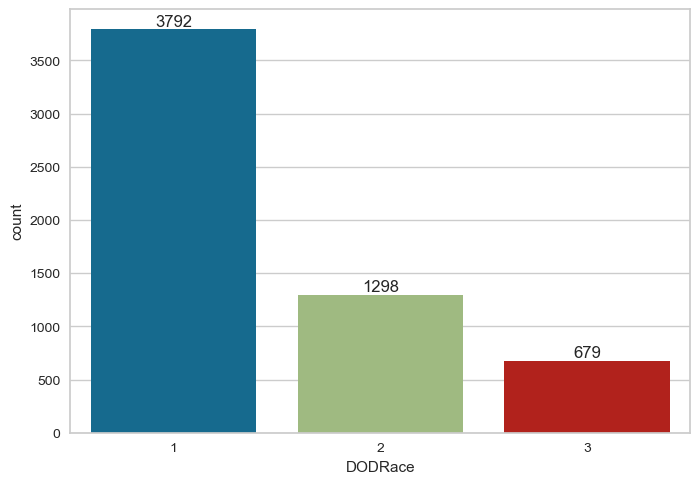

In [16]:
ax = sns.countplot(x="DODRace", data = df) # to show the proportion of each class
ax.bar_label(ax.containers[0]);

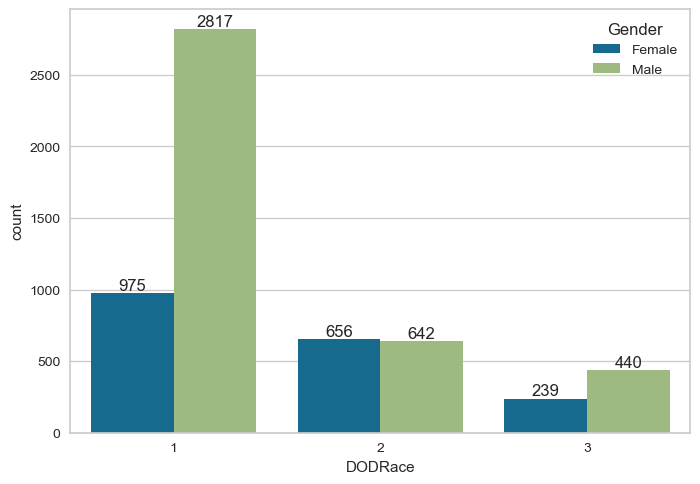

In [17]:
ax = sns.countplot(x="DODRace", hue="Gender", data = df)
for p in ax.containers:
    ax.bar_label(p)

In [18]:
df["DODRace"] = df.DODRace.map({
     1:"White" ,
    2:"Black" ,
  3: "Hispanic" })
    

In [19]:
df["DODRace"].value_counts(dropna=False)

White       3792
Black       1298
Hispanic     679
Name: DODRace, dtype: int64

In [20]:
## Now let's look at the columns that need to be considered, such as Wightlbs, and do the necessary operations.

In [21]:
df[['Weightlbs','weightkg']]

,Weightlbs,weightkg
0,142,657
1,120,534
2,147,663
3,175,782
4,195,886
...,...,...
4077,160,675
4078,194,896
4079,186,832
4080,165,731


In [22]:
df.Weightlbs.nunique()

188

In [23]:
# "Weightlbs", "Heightin" featurları askerlerin kensi rapor ettikleri bilgilerden oluştuğundan drop ediyoruz. 
df.drop([ "Weightlbs","Heightin"], axis = 1, inplace=True)

In [24]:
df[["DODRace","SubjectNumericRace","subjectid"]]

,DODRace,SubjectNumericRace,subjectid
0,Black,2,10037
1,Hispanic,3,10038
2,White,1,10042
3,Black,8,10043
4,White,1,10051
...,...,...,...
4077,White,51,29442
4078,White,1,29443
4079,White,1,29447
4080,White,1,29451


In [25]:
df.SubjectNumericRace.nunique()

40

In [26]:
df.subjectid.nunique()

5769

In [27]:
# bizim targatımız olan DODRace'i tarif eden bir featura. Data leakageye sebebiyet vereceğinden drop edeceğiz.
df.drop(["SubjectNumericRace"], axis = 1, inplace=True)

In [28]:
# subjectid askerlerin sicil numarası olduğundan ırklarına dair bize bir insight sağlamayacağından drop ediyoruz.
df.drop(["subjectid"], axis=1, inplace=True)

In [29]:
for col in df.select_dtypes("object"):
  print(f"{col} has {df[col].nunique()} unique value")

Gender has 2 unique value
Date has 253 unique value
Installation has 12 unique value
Component has 3 unique value
Branch has 3 unique value
PrimaryMOS has 281 unique value
SubjectsBirthLocation has 136 unique value
DODRace has 3 unique value
WritingPreference has 3 unique value


<AxesSubplot:ylabel='Component,DODRace'>

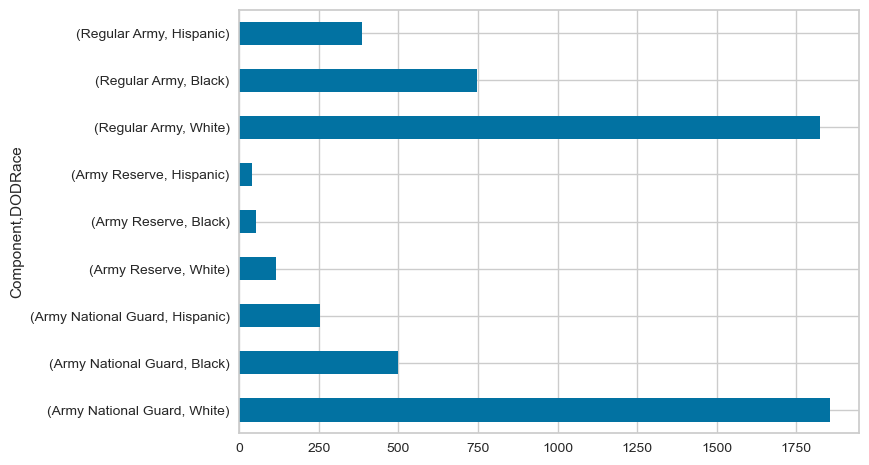

In [30]:
df.groupby(["Component"])["DODRace"].value_counts().plot(kind="barh")

In [31]:
df.groupby(["Component", "Branch"])["DODRace"].value_counts(normalize=True) #.iplot(kind="barh")
# yukarda elde ettiğimiz insightlra benzer insightlar elde ettik. Hispaniclerin baskın olduğu bir birlik veya branş yok.

Component            Branch                  DODRace 
Army National Guard  Combat Arms             White       0.802835
                                             Black       0.101804
                                             Hispanic    0.095361
                     Combat Service Support  White       0.668855
                                             Black       0.227571
                                             Hispanic    0.103574
                     Combat Support          White       0.684783
                                             Black       0.234783
                                             Hispanic    0.080435
Army Reserve         Combat Arms             White       0.833333
                                             Hispanic    0.166667
                     Combat Service Support  White       0.602941
                                             Hispanic    0.220588
                                             Black       0.176471
                     C

In [32]:
df["PrimaryMOS"].value_counts(dropna=False)

11B     641
88M     308
92A     275
91B     224
68W     207
       ... 
88D       1
270A      1
356H      1
35Q       1
91l       1
Name: PrimaryMOS, Length: 281, dtype: int64

In [33]:
df.PrimaryMOS.nunique()

281

In [34]:
# yuksek cardinalty modelimize dez avanatajsağladığı için ve target sutununa katkısı olmadığını düşündüğüm 
# unique değeri fazla olan object sutunları düşürme kararı aldım


In [35]:
drop_list1 = [ "Date", "Installation", "Component", "Branch", "PrimaryMOS",]

df.drop(drop_list1, axis=1, inplace=True)


In [36]:
# Don't forget to drop indexes. Unnecessary column
df.reset_index(drop=True, inplace=True)

In [37]:
df.shape

(5769, 98)

In [38]:
df_object = df.select_dtypes(include ="object").head()
df_object

,Gender,SubjectsBirthLocation,DODRace,WritingPreference
0,Female,Germany,Black,Right hand
1,Female,California,Hispanic,Right hand
2,Female,Texas,White,Right hand
3,Female,District of Columbia,Black,Right hand
4,Female,Texas,White,Right hand


In [39]:
fig = plt.figure(figsize=(20,80), dpi=200)

for i, col in enumerate(df.select_dtypes(["float", "int"]).columns):
        plt.subplot(40,3,i+1)
        ax = sns.boxplot(x=df[col], y= df["DODRace"])
        
plt.tight_layout();

In [40]:
df.iloc[:,:-1].iplot(kind="box")

### corelation

In [41]:
def color_red(val):
    
    if (val > 0.90 and val < 1) or (val < -0.90 and val > -1):
        color = 'red'
    else:
        color = 'black'
    return f'color: {color}'
pd.DataFrame(df.select_dtypes(include ="number")).corr().style.applymap(color_red)

# Featurların kendi arasındaki corr. -0.90, +0.90 'dan büyük olan değerleri istediğimiz renkte göstermesi için
 # Multicolineraty sorunu linear ve logisitc reg. gibi gradient descent tabanlı modellerde bir problem olarak karşımıza
# çıkar. Multicolineraty sorunu olan datalarda elde ettiğimiz scorelar farklı çıkmayacaktır. Ancak bir feature selection
# yapacaksak bu sorunu mutlaka gidermemiz gerekiyor. Regulirazition algoritmaları overfiting problemini giderdiği gibi
# multicolineraty sorununu da giderir.


,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance


# DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

In [42]:
X = df.drop("DODRace",axis=1)
y = df.DODRace

In [43]:
from sklearn.model_selection import train_test_split

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

# classification datalarını train ve test setlerine ayırırken eğer datamız inbalanced ise stratify=y parametresini
# mutlaka kullanmalıyız. Stratify parametresi 0 ve 1 classlarının birbirine olan oranını hem train datasında hemde test 
# datasında korur.

# Inbalanced datalarda bu parametre kullanılmaz ise az olan class train veya test setine dengesiz bir şekilde dağıtılabilir. 
# Bu da doğal olarak inbalanced olan classın scorlarını düşürür.

# Datanız balanced da olsa inbalanced da olsa hepsinde stratify=y kullanabilirsiniz.

In [45]:
print("Train features shape : ", X_train.shape)
print("Train target shape   : ", y_train.shape)
print("Test features shape  : ", X_test.shape)
print("Test target shape    : ", y_test.shape)

#train setine %80, test setine %20 olacak şekilde targetların dağıtımını yapmış

Train features shape :  (4615, 97)
Train target shape   :  (4615,)
Test features shape  :  (1154, 97)
Test target shape    :  (1154,)


# Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

## 1. Logistic model

### Vanilla Logistic Model

In [46]:
cat_onehot = X.select_dtypes("object").columns
cat_onehot

Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object')

In [47]:
from sklearn.compose import make_column_transformer



enc_onehot = OneHotEncoder(handle_unknown="ignore", sparse=False)

column_trans = make_column_transformer((enc_onehot,cat_onehot), remainder='passthrough')


In [48]:
from sklearn.pipeline import Pipeline
operations = [("OneHotEncoder", column_trans),  ("scaler",MinMaxScaler()),
              ("log", LogisticRegression())]

pipe_model = Pipeline(steps=operations)


In [49]:
pipe_model = Pipeline(steps=operations).set_output(transform="pandas")

In [50]:
pipe_model.fit(X_train,y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('scaler', MinMaxScaler()), ('log', LogisticRegression())])

In [51]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))
    
  # predict işlemi test datasını train datasındaki unique kategorik verilere göre transforma tabi tutarak numeric verilere 
# dönüştürüyor.

# pipeline içerisinde make_column_transform olduğundan df yapısı train datasında olduğu gibi değiştiriliyor ve predict edilmek 
# üzere ilgili modele gönderiliyor  
    

In [52]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[237   3  20]
 [ 12  79  45]
 [  4  19 735]]
              precision    recall  f1-score   support

       Black       0.94      0.91      0.92       260
    Hispanic       0.78      0.58      0.67       136
       White       0.92      0.97      0.94       758

    accuracy                           0.91      1154
   macro avg       0.88      0.82      0.84      1154
weighted avg       0.91      0.91      0.91      1154


Train_Set
[[ 951   15   72]
 [  22  312  209]
 [  30   49 2955]]
              precision    recall  f1-score   support

       Black       0.95      0.92      0.93      1038
    Hispanic       0.83      0.57      0.68       543
       White       0.91      0.97      0.94      3034

    accuracy                           0.91      4615
   macro avg       0.90      0.82      0.85      4615
weighted avg       0.91      0.91      0.91      4615



### Cross Validate for Hispanik

In [53]:
from sklearn.metrics import make_scorer
scoring = {'precision-hispanik': make_scorer(precision_score,  average= None, labels=["Hispanic"]),
           'recall-hispanik': make_scorer(recall_score, average= None, labels =["Hispanic"]),
           'f1-hispanik': make_scorer(f1_score, average= None, labels = ["Hispanic"])}


# Spesifik olarak tek bir sınıfa ait CV scorlarını görmek istiyorsak yukarıda da  gösterildiği gibi make_scorer 
#fonksiyonunu kullanmalıyız.

In [54]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression(class_weight='balanced',max_iter=1000,
                                                                          random_state=101))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]


test_precision-hispanik    0.512434
test_recall-hispanik       0.787879
test_f1-hispanik           0.619984
dtype: float64

### GridSearch for Hispanik

In [55]:
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, roc_auc_score



In [56]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression(class_weight='balanced',max_iter=1000,
                                                                          random_state=101))]

model = Pipeline(steps=operations)

In [57]:
penalty = ["l1", "l2"]
C = [0.01, 0.1, 1, 5, 16, 19, 22, 25]
solver =['liblinear', 'lbfgs']
param_grid = {"log__penalty" : penalty, "log__C" : C, 'log__solver': ['liblinear', 'lbfgs'],}
              
f1_Hispanic =  make_scorer(f1_score, average= None, labels = ["Hispanic"])
        

grid_model = GridSearchCV(model, param_grid = param_grid, scoring=f1_Hispanic, cv=5, return_train_score=True) 

In [58]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('scaler', MinMaxScaler()),
                                       ('log',
                                        LogisticRegression(class_weight='balanced',
                                                           max_iter=1000,
                                                           random_state=101))]),
             param_grid={'log__C': [0.01, 0.1, 1, 5, 16, 19, 22, 25],
                         'log__penalty': ['l1', 'l2'],
                         'log__solver': ['liblinear', 'lbfgs']},
             return_train_score=True,
             scoring=make_scorer(f1_score, average=None, labels=['Hispanic']))

In [59]:
grid_model.best_params_

{'log__C': 5, 'log__penalty': 'l2', 'log__solver': 'liblinear'}

In [60]:
grid_model.best_estimator_

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('scaler', MinMaxScaler()),
                ('log',
                 LogisticRegression(C=5, class_weight='balanced', max_iter=1000,
                                    random_state=101, solver='liblinear'))])

In [61]:
eval_metric(grid_model , X_train, y_train, X_test, y_test)

Test_Set
[[243   5  12]
 [ 11  89  36]
 [  8  44 706]]
              precision    recall  f1-score   support

       Black       0.93      0.93      0.93       260
    Hispanic       0.64      0.65      0.65       136
       White       0.94      0.93      0.93       758

    accuracy                           0.90      1154
   macro avg       0.84      0.84      0.84      1154
weighted avg       0.90      0.90      0.90      1154


Train_Set
[[ 986   14   38]
 [  20  402  121]
 [  46  141 2847]]
              precision    recall  f1-score   support

       Black       0.94      0.95      0.94      1038
    Hispanic       0.72      0.74      0.73       543
       White       0.95      0.94      0.94      3034

    accuracy                           0.92      4615
   macro avg       0.87      0.88      0.87      4615
weighted avg       0.92      0.92      0.92      4615



In [62]:
pd.DataFrame(grid_model.cv_results_).loc[grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.668669
mean_train_score    0.732148
Name: 14, dtype: object

### cross validate

In [63]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression(class_weight='balanced',max_iter=1000,
                                                                          random_state=101))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

# multiclass datalarda CV veya gridsearchCV için precision, recall ve f1 metriclerini tek başına kullanmayız. Yukarda olduğu
# gibi precision_weighted, precision_macro, precision_micro vb. yazmalıyız. Yoksa hata alırız

test_accuracy               0.860010
train_accuracy              0.875840
test_precision_weighted     0.889377
train_precision_weighted    0.905020
test_recall_weighted        0.860010
train_recall_weighted       0.875840
test_f1_weighted            0.869178
train_f1_weighted           0.884217
dtype: float64

In [64]:
y_pred=pipe_model.predict(X_test)
y_pred_proba = pipe_model.predict_proba(X_test)

test_data = pd.concat([X_test, y_test], axis=1)
test_data["pred"] = y_pred
test_data["pred_proba_white"] = y_pred_proba[:,0]
test_data["pred_proba_black"] = y_pred_proba[:,1]
test_data["pred_proba_hispanik"] = y_pred_proba[:,2]
test_data.sample(10)

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,wristheight,Gender,SubjectsBirthLocation,Age,WritingPreference,DODRace,pred,pred_proba_white,pred_proba_black,pred_proba_hispanik
4782,232,1421,325,212,1319,242,196,407,336,279,...,837,Male,Illinois,30,Right hand,White,White,0.001077,0.055931,0.942993
3823,211,1563,367,237,1452,263,215,439,336,292,...,912,Male,Minnesota,25,Right hand,White,White,0.001198,0.004791,0.994011
569,233,1305,309,196,1224,217,177,365,281,267,...,755,Female,Guyana,36,Right hand,Black,Black,0.944932,0.031066,0.024002
3122,265,1354,324,245,1239,247,196,405,343,273,...,795,Male,Tennessee,43,Right hand,White,White,0.001574,0.003160,0.995266
585,224,1373,305,247,1271,247,199,352,314,273,...,820,Female,Michigan,26,Right hand,White,White,0.479536,0.022066,0.498398
765,220,1302,310,208,1217,238,181,368,294,245,...,750,Female,Haiti,20,Right hand,Black,Black,0.993665,0.004260,0.002075
1880,272,1450,339,218,1353,244,189,412,351,278,...,863,Male,Arizona,32,Right hand,White,White,0.003250,0.338371,0.658379
1341,265,1395,351,195,1277,225,180,377,330,295,...,797,Female,South Carolina,46,Right hand,Black,Black,0.991808,0.003442,0.004749
303,198,1299,308,195,1214,211,173,341,251,237,...,761,Female,Tennessee,24,Right hand,White,White,0.030586,0.053822,0.915591
2688,278,1473,344,219,1358,246,211,443,387,246,...,862,Male,Florida,38,Right hand,Black,Black,0.744191,0.049395,0.206414


### Logistic Model GridsearchCV

In [65]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression(class_weight='balanced', max_iter=5000, random_state=101))]
 
model = Pipeline(steps=operations)

In [66]:
model.get_params()

{'memory': None,
 'steps': [('OneHotEncoder',
   ColumnTransformer(remainder='passthrough',
                     transformers=[('onehotencoder',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse=False),
                                    Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
  ('scaler', MinMaxScaler()),
  ('log',
   LogisticRegression(class_weight='balanced', max_iter=5000, random_state=101))],
 'verbose': False,
 'OneHotEncoder': ColumnTransformer(remainder='passthrough',
                   transformers=[('onehotencoder',
                                  OneHotEncoder(handle_unknown='ignore',
                                                sparse=False),
                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))]),
 'scaler': MinMaxScaler(),
 'log': LogisticRegression(class_weight='balanced', max_ite

In [67]:
penalty = ["l1", "l2"]
C = [0.01, 0.1, 1, 5, 16, 19, 22, 25]
solver =['liblinear', 'lbfgs']
param_grid = {"log__penalty" : penalty, "log__C" : C, 'log__solver': ['liblinear', 'lbfgs']}

In [68]:
grid_model = GridSearchCV(model, param_grid = param_grid, cv=5, scoring="f1_weighted", return_train_score=True) 


In [69]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('scaler', MinMaxScaler()),
                                       ('log',
                                        LogisticRegression(class_weight='balanced',
                                                           max_iter=5000,
                                                           random_state=101))]),
             param_grid={'log__C': [0.01, 0.1, 1, 5, 16, 19, 22, 25],
                         'log__penalty': ['l1', 'l2'],
                         'log__solver': ['liblinear', 'lbfgs']},
             return_train_score=True, scoring='f1_weighted')

In [70]:
grid_model.best_params_

{'log__C': 5, 'log__penalty': 'l2', 'log__solver': 'liblinear'}

In [71]:
grid_model.best_estimator_

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('scaler', MinMaxScaler()),
                ('log',
                 LogisticRegression(C=5, class_weight='balanced', max_iter=5000,
                                    random_state=101, solver='liblinear'))])

In [72]:
pd.DataFrame(grid_model.cv_results_).loc[grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.897473
mean_train_score    0.917752
Name: 14, dtype: object

In [73]:
y_pred = grid_model.predict(X_test)
y_pred

array(['Black', 'White', 'White', ..., 'Black', 'White', 'White'],
      dtype=object)

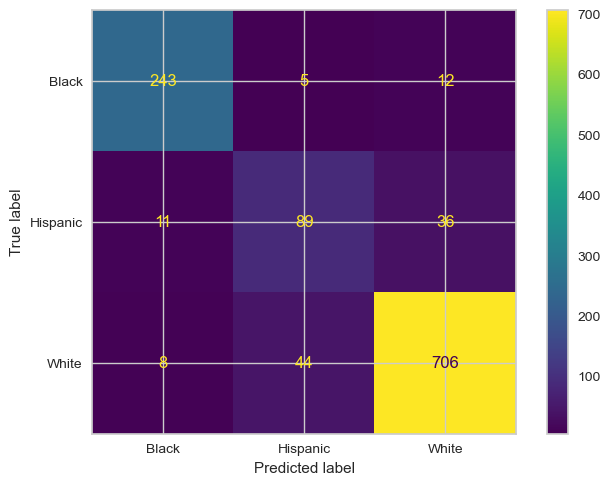

In [74]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(grid_model,X_test, y_test)
ConfusionMatrixDisplay;

In [75]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression(class_weight='balanced',C=5, max_iter=5000,
                                                                          random_state=101))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy               0.860661
train_accuracy              0.883327
test_precision_weighted     0.889812
train_precision_weighted    0.910407
test_recall_weighted        0.860661
train_recall_weighted       0.883327
test_f1_weighted            0.869674
train_f1_weighted           0.890958
dtype: float64

### PRECİSİON RECAL CURVE

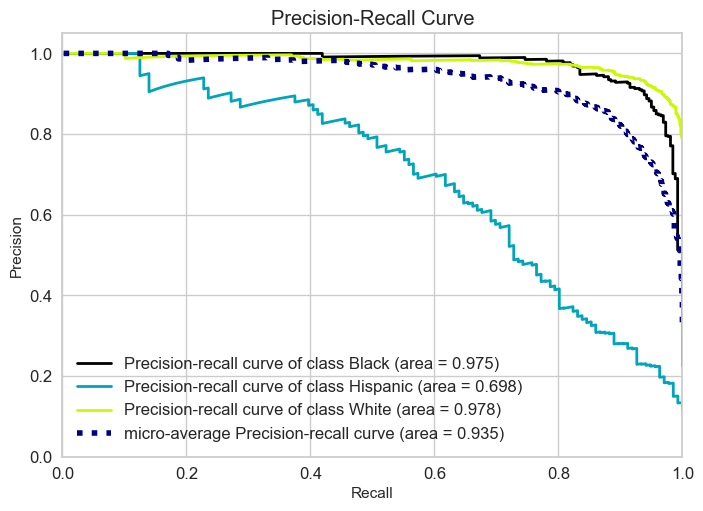

In [76]:
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall

operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("log", LogisticRegression( class_weight='balanced', C=5, max_iter=5000,  random_state=101
                                        ))]
 
model = Pipeline(steps=operations)

model.fit(X_train, y_train)

y_pred_proba = model.predict_proba(X_test)

##y_pred_proba = model.predict_proba(X_test) ...SVC de hata alırız..
    
plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [77]:
pd.get_dummies(y_test).values

array([[1, 0, 0],
       [0, 0, 1],
       [0, 0, 1],
       ...,
       [1, 0, 0],
       [0, 0, 1],
       [0, 0, 1]], dtype=uint8)

In [78]:
from sklearn.metrics import average_precision_score

y_test_dummies = pd.get_dummies(y_test).values

average_precision_score(y_test_dummies[:, 1], y_pred_proba[:, 1])

# 0 black, 1 hispanic, 2 white skorlarını döndürür.
# Burda 1 vererek hispanic skorları aldık.

0.6984058416291838

In [79]:
y_pred = grid_model.predict(X_test)

log_AP = average_precision_score(y_test_dummies[:, 1], y_pred_proba[:, 1])
log_f1 = f1_score(y_test, y_pred, average=None, labels=["Hispanic"])
log_recall = recall_score(y_test, y_pred, average=None, labels=["Hispanic"])

# tüm modellerden aldığımız skorları aşağıda tabloda karşılaştıracağımızdan skorlarımızı değişkenlere atıyoruz.

## 2. SVC

### Vanilla SVC model 

In [80]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix

In [81]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [82]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("svm", SVC(class_weight="balanced", random_state=101))]
 
svm_pipe = Pipeline(steps=operations)
svm_pipe.fit(X_train, y_train)



eval_metric(svm_pipe, X_train, y_train, X_test, y_test)


Test_Set
[[240  12   8]
 [ 12 102  22]
 [ 15 111 632]]
              precision    recall  f1-score   support

       Black       0.90      0.92      0.91       260
    Hispanic       0.45      0.75      0.57       136
       White       0.95      0.83      0.89       758

    accuracy                           0.84      1154
   macro avg       0.77      0.84      0.79      1154
weighted avg       0.88      0.84      0.86      1154


Train_Set
[[ 956   39   43]
 [  20  459   64]
 [  53  397 2584]]
              precision    recall  f1-score   support

       Black       0.93      0.92      0.93      1038
    Hispanic       0.51      0.85      0.64       543
       White       0.96      0.85      0.90      3034

    accuracy                           0.87      4615
   macro avg       0.80      0.87      0.82      4615
weighted avg       0.90      0.87      0.88      4615



### SVC Cross Validate for Hispanic

In [83]:
from sklearn.metrics import make_scorer
scoring = {'precision-hispanik': make_scorer(precision_score,  average= None, labels=["Hispanic"]),
           'recall-hispanik': make_scorer(recall_score, average= None, labels =["Hispanic"]),
           'f1-hispanik': make_scorer(f1_score, average= None, labels = ["Hispanic"])}

In [84]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("svm", SVC(class_weight="balanced"))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision-hispanik    0.473355
test_recall-hispanik       0.775152
test_f1-hispanik           0.587498
dtype: float64

### SVC GridSearch for Hispanic

In [85]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("svm", SVC(class_weight="balanced", random_state=101))]

model = Pipeline(steps=operations)

In [86]:
param_grid = {'SVC__C': [ 0.6, 0.9],
              'SVC__gamma': ["scale", "auto", 0.01]
              }  ## 'SVC__kernel': ['rbf', 'linear']

In [87]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("SVC", SVC(class_weight="balanced", probability=True,max_iter=5000),)]

model = Pipeline(steps=operations)

f1_Hispanic =  make_scorer(f1_score, average= None, labels = ["Hispanic"])

svm_model_grid = GridSearchCV(model, 
                              param_grid=param_grid, 
                              scoring= f1_Hispanic,
                                     
                              cv=5, 
                              return_train_score=True, n_jobs=-1)

In [88]:
svm_model_grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('scaler', MinMaxScaler()),
                                       ('SVC',
                                        SVC(class_weight='balanced',
                                            max_iter=5000,
                                            probability=True))]),
             n_jobs=-1,
             param_grid={'SVC__C': [0.6, 0.9],
                         'SVC__gamma': ['scale', 'auto', 0.01]},
             return_train_score=True,
             scoring=make_scorer(f1_score, average=None, labels=['Hispanic']))

In [89]:
svm_model_grid.best_params_

{'SVC__C': 0.9, 'SVC__gamma': 'scale'}

In [90]:
svm_model_grid.best_estimator_

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('scaler', MinMaxScaler()),
                ('SVC',
                 SVC(C=0.9, class_weight='balanced', max_iter=5000,
                     probability=True))])

In [91]:
pd.DataFrame(svm_model_grid.cv_results_).loc[svm_model_grid.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.578645
mean_train_score    0.632654
Name: 3, dtype: object

###  SVM Cross Validate 

In [92]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("svm", SVC(class_weight="balanced", probability=True,max_iter=5000))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

# Overfiting kontrolünü burada sağlıyoruz.

test_accuracy               0.846582
train_accuracy              0.864211
test_precision_weighted     0.882423
train_precision_weighted    0.899075
test_recall_weighted        0.846582
train_recall_weighted       0.864211
test_f1_weighted            0.858073
train_f1_weighted           0.874576
dtype: float64

###  SVC Model GridsearchCV

In [93]:
param_grid = {'SVC__C': [ 0.6, 0.9],
              'SVC__gamma': ["scale", "auto"]
              }
              

In [94]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("SVC", SVC(class_weight="balanced", probability=True,max_iter=5000),)]

model = Pipeline(steps=operations)

svm_model_grid = GridSearchCV(model, 
                              param_grid=param_grid, 
                              scoring= 
                                    'f1_weighted', 
                              cv=5, 
                              return_train_score=True, n_jobs=-1)


# SVC predict_proba üzerinden prediction yapmaz. Tahminleri decision_function 
# üzerinden yapar. Eğer predict_proba almak istiyorsak SVC'nin probabilty 
# hyper_parametresini True olarak düzenlememiz gerekiyor.
# Decision_funksionın ne olduğuna aşağıda değineceğiz.

In [95]:
svm_model_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('scaler', MinMaxScaler()),
                                       ('SVC',
                                        SVC(class_weight='balanced',
                                            max_iter=5000,
                                            probability=True))]),
             n_jobs=-1,
             param_grid={'SVC__C': [0.6, 0.9], 'SVC__gamma': ['scale', 'auto']},
             return_train_score=True, scoring='f1_weighted')

In [96]:
svm_model_grid.best_params_

{'SVC__C': 0.9, 'SVC__gamma': 'scale'}

In [97]:
svm_model_grid.best_estimator_

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('scaler', MinMaxScaler()),
                ('SVC',
                 SVC(C=0.9, class_weight='balanced', max_iter=5000,
                     probability=True))])

In [98]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

Test_Set
[[240  12   8]
 [ 12 101  23]
 [ 13 109 636]]
              precision    recall  f1-score   support

       Black       0.91      0.92      0.91       260
    Hispanic       0.45      0.74      0.56       136
       White       0.95      0.84      0.89       758

    accuracy                           0.85      1154
   macro avg       0.77      0.83      0.79      1154
weighted avg       0.88      0.85      0.86      1154


Train_Set
[[ 947   44   47]
 [  21  457   65]
 [  53  400 2581]]
              precision    recall  f1-score   support

       Black       0.93      0.91      0.92      1038
    Hispanic       0.51      0.84      0.63       543
       White       0.96      0.85      0.90      3034

    accuracy                           0.86      4615
   macro avg       0.80      0.87      0.82      4615
weighted avg       0.90      0.86      0.87      4615



In [99]:
pd.DataFrame(svm_model_grid.cv_results_).loc[svm_model_grid.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.853431
mean_train_score    0.873461
Name: 2, dtype: object

In [100]:
operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
              ("svm", SVC(C=0.9, class_weight='balanced', kernel='linear', max_iter=5000,
    probability=True))]

model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy               0.853728
train_accuracy              0.874780
test_precision_weighted     0.887874
train_precision_weighted    0.906322
test_recall_weighted        0.853728
train_recall_weighted       0.874780
test_f1_weighted            0.864208
train_f1_weighted           0.883609
dtype: float64

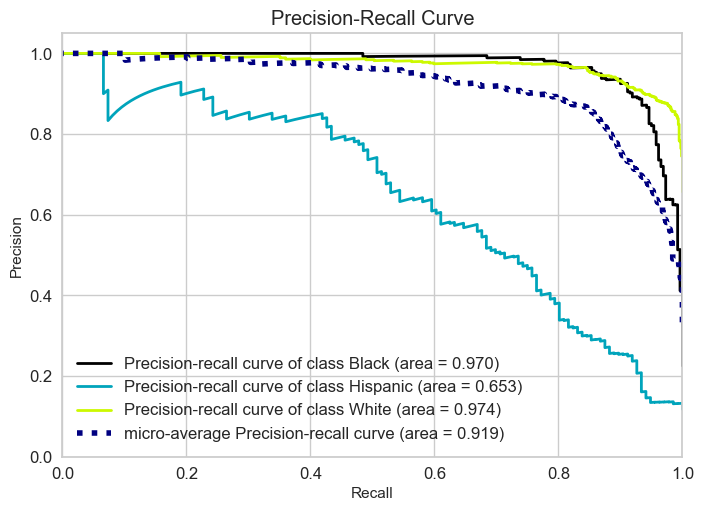

In [101]:
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall

operations = [("OneHotEncoder", column_trans), ("scaler",MinMaxScaler()),
               ("svm", SVC(C=1,  kernel='linear', class_weight='balanced', max_iter=5000,
    probability=True))]
 
model = Pipeline(steps=operations)

model.fit(X_train, y_train)

decision_function = model.decision_function(X_test)


## y_pred_proba = model.predict_proba(X_test)  ...SVC de hata alırız..
    
plot_precision_recall(y_test, decision_function )
plt.show();

In [102]:
pd.get_dummies(y_test).values

array([[1, 0, 0],
       [0, 0, 1],
       [0, 0, 1],
       ...,
       [1, 0, 0],
       [0, 0, 1],
       [0, 0, 1]], dtype=uint8)

In [103]:
decision_function

array([[ 2.27612767,  1.18838619, -0.28656033],
       [-0.25971046,  0.9814508 ,  2.26065636],
       [-0.27919308,  1.13788601,  2.2721865 ],
       ...,
       [ 2.30030552, -0.28607136,  0.74918271],
       [-0.29048402,  0.87285501,  2.29363115],
       [-0.26358775,  1.1885529 ,  2.23746355]])

In [104]:
average_precision_score(y_test_dummies[:, 1], decision_function[:, 1])

0.6533895942879465

In [105]:
y_pred = svm_model_grid.predict(X_test)

svc_AP = average_precision_score(y_test_dummies[:, 1], decision_function[:, 1])
svc_f1 = f1_score(y_test, y_pred, average=None, labels=["Hispanic"])
svc_recall = recall_score(y_test, y_pred, average=None, labels=["Hispanic"])

## 3. RF

### Vanilla RF Model

In [106]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OrdinalEncoder
cat = X.select_dtypes("object").columns


ord_enc = OrdinalEncoder(handle_unknown='use_encoded_value', 
                         unknown_value=-1)

column_trans = make_column_transformer((ord_enc, cat), 
                                       remainder='passthrough')

In [107]:


operations_rf = [("OrdinalEncoder", column_trans),
                 ("RF_model", RandomForestClassifier(class_weight="balanced", 
                                                     random_state=101))]

pipe_model_rf = Pipeline(steps=operations_rf)

pipe_model_rf.fit(X_train, y_train)

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('RF_model',
                 RandomForestClassifier(class_weight='balanced',
                                        random_state=101))])

In [108]:
eval_metric(pipe_model_rf, X_train, y_train, X_test, y_test)

Test_Set
[[182   0  78]
 [  6   6 124]
 [ 11   5 742]]
              precision    recall  f1-score   support

       Black       0.91      0.70      0.79       260
    Hispanic       0.55      0.04      0.08       136
       White       0.79      0.98      0.87       758

    accuracy                           0.81      1154
   macro avg       0.75      0.57      0.58      1154
weighted avg       0.79      0.81      0.76      1154


Train_Set
[[1038    0    0]
 [   0  543    0]
 [   0    0 3034]]
              precision    recall  f1-score   support

       Black       1.00      1.00      1.00      1038
    Hispanic       1.00      1.00      1.00       543
       White       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [109]:
operations_rf = [("OrdinalEncoder", column_trans), 
                 ("RF_model", RandomForestClassifier(class_weight="balanced",
                                                     random_state=101))]

model = Pipeline(steps=operations_rf)

scores = cross_validate(model,
                        X_train, 
                        y_train,
                        scoring=scoring,
                        cv=5,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_precision-hispanik     0.813095
train_precision-hispanik    1.000000
test_recall-hispanik        0.040554
train_recall-hispanik       1.000000
test_f1-hispanik            0.076836
train_f1-hispanik           1.000000
dtype: float64

### RF Model GridsearchCV

In [110]:
param_grid = {'RF_model__n_estimators':[400,500],
             'RF_model__max_depth':[2,3],'RF_model__max_features': ['auto', None, 15, 20]} #'min_samples_split':[18,20,22],
##'max_features': ['auto', None, 15, 20]

In [111]:
operations_rf = [("OrdinalEncoder", column_trans),
                 ("RF_model", RandomForestClassifier(class_weight="balanced", random_state=101))]
                                                     
f1_Hispanic =  make_scorer(f1_score, average= None, labels = ["Hispanic"]) 

model = Pipeline(steps=operations_rf)
rf_grid_model = GridSearchCV(model,
                             param_grid,
                             scoring=f1_Hispanic ,
                             n_jobs=-1,
                             return_train_score=True)

In [112]:
rf_grid_model.fit(X_train,y_train)

GridSearchCV(estimator=Pipeline(steps=[('OrdinalEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ordinalencoder',
                                                                         OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                        unknown_value=-1),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('RF_model',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=101))]),
             n_jobs=-1,
             param_grid={'RF_model__max_depth': [2, 3],
                         'RF_model__max_features': ['auto', None, 15, 20],
                         'RF_model__n_estimators': [400, 500]},
             return_train_score=True,
             scoring=make_scorer(f1_score, average=None, labels=['Hispanic']))

In [113]:
rf_grid_model.best_estimator_

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('RF_model',
                 RandomForestClassifier(class_weight='balanced', max_depth=3,
                                        max_features=15, n_estimators=400,
                                        random_state=101))])

In [114]:
rf_grid_model.best_params_

{'RF_model__max_depth': 3,
 'RF_model__max_features': 15,
 'RF_model__n_estimators': 400}

In [115]:
pd.DataFrame(rf_grid_model.cv_results_).loc[rf_grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.311509
mean_train_score    0.342229
Name: 12, dtype: object

In [116]:
rf_grid_model.best_score_

0.3115087872917788

In [117]:
eval_metric(rf_grid_model, X_train, y_train, X_test, y_test)

Test_Set
[[199  36  25]
 [ 13  87  36]
 [ 74 257 427]]
              precision    recall  f1-score   support

       Black       0.70      0.77      0.73       260
    Hispanic       0.23      0.64      0.34       136
       White       0.88      0.56      0.69       758

    accuracy                           0.62      1154
   macro avg       0.60      0.66      0.58      1154
weighted avg       0.76      0.62      0.65      1154


Train_Set
[[ 800  158   80]
 [  52  359  132]
 [ 267 1053 1714]]
              precision    recall  f1-score   support

       Black       0.71      0.77      0.74      1038
    Hispanic       0.23      0.66      0.34       543
       White       0.89      0.56      0.69      3034

    accuracy                           0.62      4615
   macro avg       0.61      0.67      0.59      4615
weighted avg       0.77      0.62      0.66      4615



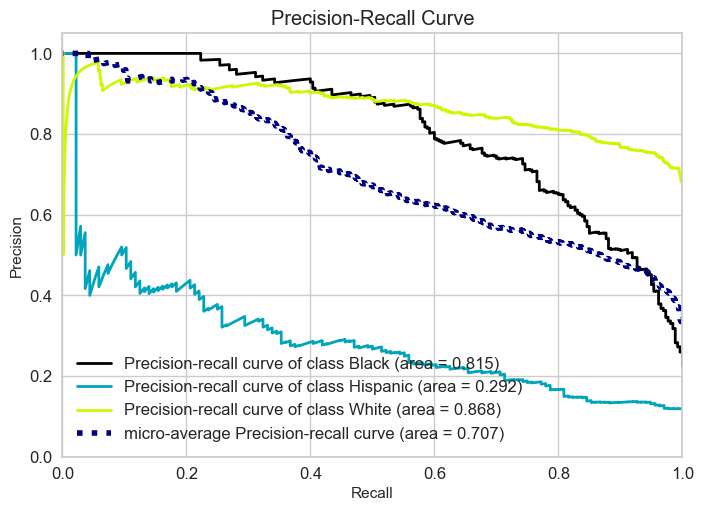

In [118]:
operations_rf = [("OrdinalEncoder", column_trans), 
                 ("RF_model", RandomForestClassifier(class_weight="balanced",
                                                     max_depth=3, 
                                                     n_estimators=400, 
                                                     random_state=101))]

model = Pipeline(steps=operations_rf)

model.fit(X_train, y_train)

y_pred_proba = model.predict_proba(X_test)
    
plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [119]:
average_precision_score(y_test_dummies[:, 1], y_pred_proba[:, 1])

0.2923135634646148

In [120]:
y_pred = rf_grid_model.predict(X_test)

rf_AP = average_precision_score(y_test_dummies[:, 1], y_pred_proba[:, 1])
rf_f1 = f1_score(y_test, y_pred, average=None, labels=["Hispanic"])
rf_recall = recall_score(y_test, y_pred, average=None, labels=["Hispanic"])

## 4. XGBoost

### Vanilla XGBoost Model

In [121]:
from xgboost import XGBClassifier
operations_xgb = [("OrdinalEncoder", column_trans), 
                  ("XGB_model", XGBClassifier(random_state=101))]

pipe_model_xgb = Pipeline(steps=operations_xgb)

y_train_xgb = y_train.map({"Black":0, "Hispanic":1, "White":2}) # sıralama classification_report ile aynı olacak.
y_test_xgb = y_test.map({"Black":0, "Hispanic":1, "White":2})
# xgb 1.6 ve üzeri versiyonlarda target numeric olmaz ise hata döndürüyor. Bu sebeple manuel olarak dönüşümü yapıyoruz.


pipe_model_xgb.fit(X_train, y_train_xgb)

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('XGB_model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               objective='multi:softprob', predictor=None, ...))])

In [122]:
eval_metric(pipe_model_xgb, X_train, y_train_xgb, X_test, y_test_xgb)

Test_Set
[[227   1  32]
 [  7  51  78]
 [ 11  15 732]]
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       260
           1       0.76      0.38      0.50       136
           2       0.87      0.97      0.92       758

    accuracy                           0.88      1154
   macro avg       0.85      0.74      0.77      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[1038    0    0]
 [   0  543    0]
 [   0    0 3034]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1038
           1       1.00      1.00      1.00       543
           2       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [123]:
from sklearn.utils import class_weight
classes_weights = class_weight.compute_sample_weight(class_weight='balanced', 
                                                     y=y_train_xgb)
classes_weights

# XGboost algortimasının multiclass datalar için weight_class hyper parametresi olmadığından. fit fonksiyonu içinde 
# sample_weight hyper paremetresini kullanabiliyoruz.

array([0.50703142, 0.50703142, 0.50703142, ..., 0.50703142, 0.50703142,
       0.50703142])

In [124]:
my_dict = {"weights": classes_weights, "label":y_train_xgb}

comp = pd.DataFrame(my_dict)

comp.head()

,weights,label
5204,0.507031,2
5393,0.507031,2
5528,0.507031,2
3861,0.507031,2
3205,0.507031,2


In [125]:
comp.groupby("label").value_counts()

# weight x class_sayısı bize aynı sonuçları verecektir.

label  weights 
0      1.482017    1038
1      2.833026     543
2      0.507031    3034
dtype: int64

In [126]:
pipe_model_xgb.fit(X_train,
                   y_train_xgb,  
                   XGB_model__sample_weight=classes_weights)
# XGBoost'taki ağırlık parametresi, sınıf başına değil örnek başınadır. 
#Bu nedenle, her sınıfın ağırlığını kendi sınıfına atamamız gerekir.


Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('XGB_model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               objective='multi:softprob', predictor=None, ...))])

In [127]:
eval_metric(pipe_model_xgb, X_train, y_train_xgb, X_test, y_test_xgb)

Test_Set
[[229   3  28]
 [ 10  61  65]
 [ 17  28 713]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       260
           1       0.66      0.45      0.54       136
           2       0.88      0.94      0.91       758

    accuracy                           0.87      1154
   macro avg       0.81      0.76      0.78      1154
weighted avg       0.86      0.87      0.86      1154


Train_Set
[[1038    0    0]
 [   0  543    0]
 [   0    0 3034]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1038
           1       1.00      1.00      1.00       543
           2       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [128]:
scoring_xgb = {"precision_Hispanic" : make_scorer(precision_score, average = None, labels =[1]),
           "recall_Hispanic" : make_scorer(recall_score, average = None, labels =[1]),
           "f1_Hispanic" : make_scorer(f1_score, average = None, labels =[1])}

# xgb categric target kabul etmediğinden hispaniclere karşılık gelen 1 numeric clasıına göre scoring_xgb'u düzenliyoruz.

In [129]:
operations_xgb = [("OrdinalEncoder", column_trans), 
                  ("XGB_model", XGBClassifier(random_state=101))]

model = Pipeline(steps=operations_xgb)

scores = cross_validate(model, 
                        X_train, 
                        y_train_xgb, 
                        scoring=scoring_xgb,
                        cv=5, 
                        return_train_score=True,
                        fit_params={"XGB_model__sample_weight":classes_weights})
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_precision_Hispanic     0.712584
train_precision_Hispanic    1.000000
test_recall_Hispanic        0.441981
train_recall_Hispanic       1.000000
test_f1_Hispanic            0.544594
train_f1_Hispanic           1.000000
dtype: float64

### XGBoost Model GridsearchCV

In [130]:
param_grid = {"XGB_model__n_estimators":[20, 40],
              'XGB_model__max_depth':[1,2],
              "XGB_model__learning_rate": [0.03, 0.05],
              "XGB_model__subsample":[0.8, 1],
              "XGB_model__colsample_bytree":[0.8, 1]}

In [131]:
operations_xgb = [("OrdinalEncoder", column_trans),
                  ("XGB_model", XGBClassifier(random_state=101))]

model = Pipeline(steps=operations_xgb)

xgb_grid_model = GridSearchCV(model, 
                              param_grid, 
                              scoring=make_scorer(recall_score, average = None, labels =[1]),
                              cv=5,
                              n_jobs=-1,
                              return_train_score=True)

In [132]:
xgb_grid_model.fit(X_train,
                   y_train_xgb,
                   XGB_model__sample_weight=classes_weights)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OrdinalEncoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ordinalencoder',
                                                                         OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                        unknown_value=-1),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                                       ('XGB_model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks...
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=101, ...))]),
             n_jobs=-1,
             param_grid={'XGB_model__colsample_bytree': [0.8, 1],
                         'XGB_model__learning_rate': [0.03, 0.05],
                         'XGB_model__max_depth': [1, 2],
                         'XGB_model__n_estimators': [20, 40],
                         'XGB_model__subsample': [0.8, 1]},
             return_train_score=True,
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [133]:
xgb_grid_model.best_estimator_

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('XGB_model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.05,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=2, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=40,
                               n_jobs=None, num_parallel_tree=None,
                               objective='multi:softprob', predictor=None, ...))])

In [134]:
xgb_grid_model.best_params_

{'XGB_model__colsample_bytree': 0.8,
 'XGB_model__learning_rate': 0.05,
 'XGB_model__max_depth': 2,
 'XGB_model__n_estimators': 40,
 'XGB_model__subsample': 0.8}

In [135]:
pd.DataFrame(xgb_grid_model.cv_results_).loc[xgb_grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score      0.59842
mean_train_score    0.648253
Name: 14, dtype: object

In [136]:
xgb_grid_model.best_score_

0.5984199796126402

In [137]:
eval_metric(xgb_grid_model, X_train, y_train_xgb, X_test, y_test_xgb)

Test_Set
[[201  37  22]
 [ 18  78  40]
 [ 79 195 484]]
              precision    recall  f1-score   support

           0       0.67      0.77      0.72       260
           1       0.25      0.57      0.35       136
           2       0.89      0.64      0.74       758

    accuracy                           0.66      1154
   macro avg       0.60      0.66      0.60      1154
weighted avg       0.76      0.66      0.69      1154


Train_Set
[[ 805  153   80]
 [  70  346  127]
 [ 272  744 2018]]
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1038
           1       0.28      0.64      0.39       543
           2       0.91      0.67      0.77      3034

    accuracy                           0.69      4615
   macro avg       0.63      0.69      0.63      4615
weighted avg       0.79      0.69      0.72      4615



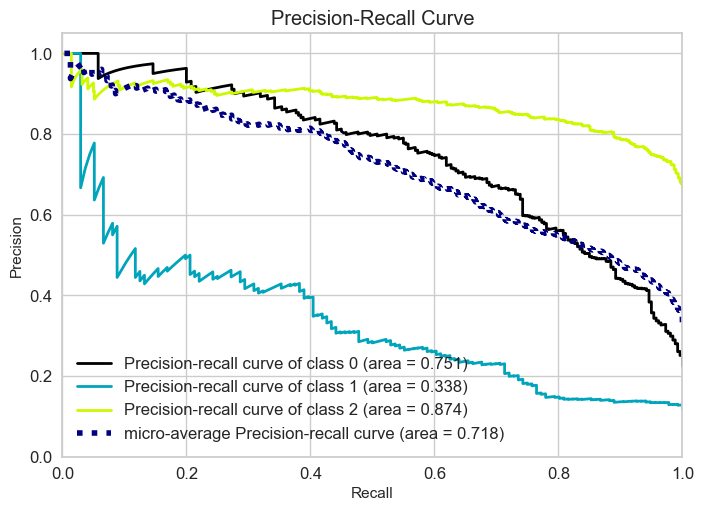

In [138]:
from scikitplot.metrics import plot_roc, precision_recall_curve


operations_xgb = [("OrdinalEncoder", column_trans), 
                  ("XGB_model", XGBClassifier(colsample_bytree=0.8,
                                              learning_rate=0.05,
                                              max_depth=2,
                                              n_estimators=20,
                                              subsample=0.8,
                                              random_state=101))]

model = Pipeline(steps=operations_xgb)

model.fit(X_train, 
          y_train_xgb, 
          XGB_model__sample_weight=classes_weights)

y_pred_proba = model.predict_proba(X_test)
    
plot_precision_recall(y_test_xgb, y_pred_proba)
plt.show()

In [139]:
y_test_xgb_dummies = pd.get_dummies(y_test_xgb).values

In [140]:
average_precision_score(y_test_xgb_dummies[:, 1], y_pred_proba[:, 1])

0.33845910735146734

In [141]:
y_pred = xgb_grid_model.predict(X_test)

xgb_AP = average_precision_score(y_test_xgb_dummies[:, 1], y_pred_proba[:, 1])
xgb_f1 = f1_score(y_test_xgb, y_pred, average=None, labels=[1])
xgb_recall = recall_score(y_test_xgb, y_pred, average=None, labels=[1])

## Comparing Models

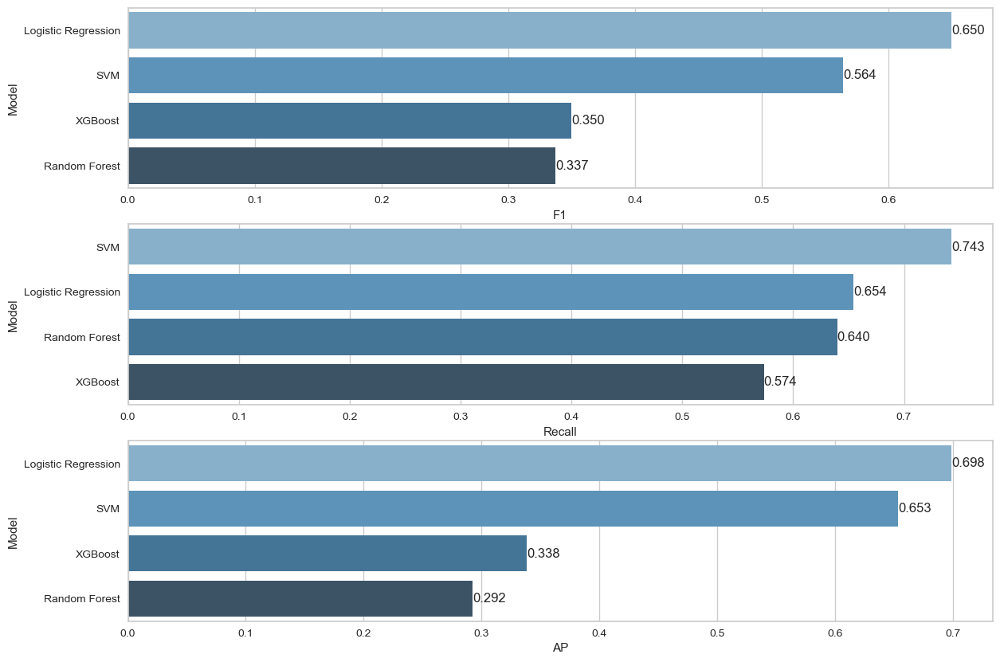

In [142]:
compare = pd.DataFrame({"Model": ["Logistic Regression", "SVM",  "Random Forest", "XGBoost"],
                        "F1": [log_f1[0], svc_f1[0], rf_f1[0], xgb_f1[0]],
                        "Recall": [log_recall[0], svc_recall[0], rf_recall[0], xgb_recall[0]],
                        "AP": [log_AP, svc_AP, rf_AP, xgb_AP]})

    
plt.figure(figsize=(14,10))
plt.subplot(311)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.subplot(312)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.subplot(313)
compare = compare.sort_values(by="AP", ascending=False)
ax=sns.barplot(x="AP", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.3f")
plt.show();

## Before the Deployment

In [143]:
column_trans_final = make_column_transformer((OneHotEncoder(handle_unknown="ignore", 
                                                            sparse=False), cat),
                                              remainder=MinMaxScaler())

operations_final = [("OneHotEncoder",column_trans_final),
                    ("log", LogisticRegression(class_weight='balanced',
                                               max_iter=10000,
                                               random_state=101))]

final_model = Pipeline(steps=operations_final)

In [144]:
final_model.fit(X, y)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('log',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    random_state=101))])

In [145]:
X[X.Gender=="Male"].describe()

# Datamızdaki tüm erkek askerlerin ortalama değerleri üzerinden modele tahmnin yaptıracağız.

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Age
count,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.00000,3899.000000,3899.000000,3899.000000,3899.000000,...,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000,3899.000000
mean,255.449090,1442.946397,335.819441,229.590921,1331.098487,252.16594,201.229546,416.004360,358.579636,275.632213,...,478.017953,327.110798,943.043344,238.560400,388.017440,1058.239805,858.714286,176.168761,848.762247,30.172352
std,37.295117,62.356906,17.281413,14.579399,58.714251,12.89351,10.329358,19.074837,34.511924,17.512428,...,27.662347,34.680178,111.463219,34.730231,29.360557,51.599179,141.506945,8.855214,41.138763,8.835481
min,163.000000,1194.000000,270.000000,156.000000,1106.000000,186.00000,156.000000,337.000000,246.000000,219.000000,...,383.000000,232.000000,648.000000,161.000000,293.000000,876.000000,393.000000,149.000000,695.000000,18.000000
25%,228.000000,1401.000000,324.000000,220.000000,1291.000000,244.00000,194.000000,403.000000,335.000000,263.000000,...,460.000000,301.000000,859.000000,212.000000,368.000000,1023.000000,760.000000,170.000000,820.000000,23.000000
50%,252.000000,1441.000000,335.000000,229.000000,1330.000000,252.00000,201.000000,415.000000,358.000000,275.000000,...,477.000000,326.000000,940.000000,235.000000,387.000000,1057.000000,849.000000,176.000000,848.000000,28.000000
75%,280.000000,1483.000000,347.000000,239.000000,1368.000000,261.00000,208.000000,428.000000,380.000000,288.000000,...,495.000000,351.000000,1018.000000,261.000000,407.000000,1092.000000,947.000000,182.000000,875.000000,36.500000
max,451.000000,1683.000000,393.000000,293.000000,1553.000000,306.00000,245.000000,489.000000,490.000000,334.000000,...,598.000000,459.000000,1379.000000,406.000000,494.000000,1245.000000,1442.000000,216.000000,1009.000000,58.000000


In [146]:
male_mean_human = X[X.Gender=="Male"].describe(include="all").loc["mean"]
male_mean_human

# mean değerlerini loc["mean"] ile çekiyoruz. include="all" diyerek kategorik verilerinde döndürülmesini istiyoruz. 
# Kategorik veriler Nan döneceğinden bu kategorik gözlemlere aşağıdaki atamaları yapıyoruz.

abdominalextensiondepthsitting      255.44909
acromialheight                    1442.946397
acromionradialelength              335.819441
anklecircumference                 229.590921
axillaheight                      1331.098487
                                     ...     
wristheight                        848.762247
Gender                                    NaN
SubjectsBirthLocation                     NaN
Age                                 30.172352
WritingPreference                         NaN
Name: mean, Length: 97, dtype: object

In [147]:
male_mean_human["Gender"] = "Male"
male_mean_human["SubjectsBirthLocation"] = "California"
male_mean_human["WritingPreference"] = "Right hand"

# ilgili atamaları yapıyoruz.

In [148]:
pd.DataFrame(male_mean_human).T

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,SubjectsBirthLocation,Age,WritingPreference
mean,255.44909,1442.946397,335.819441,229.590921,1331.098487,252.16594,201.229546,416.00436,358.579636,275.632213,...,238.5604,388.01744,1058.239805,858.714286,176.168761,848.762247,Male,California,30.172352,Right hand


In [149]:
final_model.predict(pd.DataFrame(male_mean_human).T)

# erkek askerlerin ortalama değerleri hispanic askerlere çok yakınmış diyebiliriz.

array(['Hispanic'], dtype=object)

In [150]:
from sklearn.metrics import matthews_corrcoef

y_pred = final_model.predict(X_test)

matthews_corrcoef(y_test, y_pred)

# dengesiz verisetlerinde accuracy güvenilmez bir metrictir. Bu sebeple dengesiz ver setlerinin accuracy'de denen 
# matthews_corrcoef ve cohen_kappa_score kullanılabilir.

0.7806215008641889

In [151]:
from sklearn.metrics import cohen_kappa_score

cohen_kappa_score(y_test, y_pred)

0.7717323344380937

---
---

# SMOTE
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

##  Smote implement

In [152]:
##!pip install imblearn

In [153]:
from imblearn.over_sampling import SMOTE # azınlık olan classları çoğunluk classa eşitler veya yakınlaştırır.
from imblearn.under_sampling import RandomUnderSampler # çoğunluk olan classı azınlık olan classa eşitler veya yakınlaştırır
from imblearn.pipeline import Pipeline as imbpipeline

# imblearn.pipeline skleran kütüphanesinin pipeline kütüphanesinden farklıdır. sklearn pipeline sadece fit, transform, predict 
# ve predict_proba fonksiyonlarını çalıştırırken imblearn.pipeline bunlara ilave olarak resample fonksiyonunu da çalıştırır.

In [154]:
column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", 
                                                      sparse=False), cat), 
                                       remainder=MinMaxScaler())

In [155]:
X_train_ohe = column_trans.fit_transform(X_train)

# Önce manuel olarak X_train ve X_test' one hot encoder dönüşümü uyguluyoruz. 

In [156]:
over = SMOTE()
X_train_over, y_train_over = over.fit_resample(X_train_ohe, y_train)

# over_sampling(smote) ve under_sampling (RandomUnderSampler) sadece X_train ve y_train'e uygulanır. tüm dataya uygulanıp sonra
# data train ve test setine ayrılırsa data_leakege gereçekleşir ve scorlarınız çok iyi olur. Bu sebeple data önce train ve 
# test setine ayrılmalı ve sonra da sadece train datasına uygulanmalıdır.

In [157]:
X_train_over.shape

(9102, 225)

In [158]:
y_train_over.value_counts()

# gördüğünüz gibi smote sonrası tüm classlar çoğunluk sınıf olan white'in gözlem sayısına eşitlendi.

# Ancak azınlık sınıfı çoğunluk olan sınıfa eşitlemek veya yaklaştırmak modeli overfitinge götürecektir. O yüzden azınlık sınıfa
# ait gözlem sayısı overfiting kontrolü yapılarak kontrollü bir şekilde artırılmalıdır.

White       3034
Black       3034
Hispanic    3034
Name: DODRace, dtype: int64

In [159]:
under = RandomUnderSampler()
X_train_under, y_train_under = under.fit_resample(X_train_ohe, y_train)

In [160]:
X_train_under.shape

(1629, 225)

In [161]:
y_train_under.value_counts()

# gördüğünüz gibi RandomUnderSampler sonrası tüm classlar azınlık sınıf olan hispanic'in gözlem sayısına eşitlendi.

# coğunluk sınıfı azınlık sınıfa eşitlemek veya yakınlaştırmak çoğunluk classtaki gözlemlerden çok ciddi bilgi kaybına sebep
# verecektir. Skorlar iyileşse de bu iyileşme sadece yalancı bir iyilşeme olacaktır. Bu sebeple Çoğunluk sınıftan %20-%30
# aralığında bir azaltmaya gidilmeli. Ancak hala skorlarda bir iyilşeme yoksa bu oran daha da kesinlikle artırılmamalıdır.

Black       543
Hispanic    543
White       543
Name: DODRace, dtype: int64

In [162]:
over = SMOTE(sampling_strategy={"Hispanic": 1000})
under = RandomUnderSampler(sampling_strategy={"White": 2500})

# sampling_strategy hyper_parametresi ile classları isteğimiz sayıda artıra bilir veya azaltabiliriz.



In [163]:
y_train.value_counts()

# orjinal hispanic gözlem sayımız 543 olduğunu görüyoruz.

White       3034
Black       1038
Hispanic     543
Name: DODRace, dtype: int64

In [164]:
X_resampled_over, y_resampled_over = over.fit_resample(X_train_ohe, y_train)

In [165]:
y_resampled_over.value_counts()

# over ile datamızdaki hispanic classının gözlem sayısını yaklaşık 2 katına çıkardık. Ama bu artışın overfitinge sebep
# olup olmadığını aşağıda kontrol etmemiz gerekiyor.

White       3034
Black       1038
Hispanic    1000
Name: DODRace, dtype: int64

In [166]:
X_resampled_under, y_resampled_under = under.fit_resample(X_train_ohe, y_train)

In [167]:
y_resampled_under.value_counts()
# white gözlem sayısını yaklaşık %18 civarında azaltıp 2500'e eşitledik.

White       2500
Black       1038
Hispanic     543
Name: DODRace, dtype: int64

In [168]:
# Yaptığımız over_sampling ve under_sampling işlemlerimizi otomotize hale getiriyoruz.
steps = [('o', over), ('u', under)]


pipeline = imbpipeline(steps=steps)

#önce hispanic calsının sayısı bizim verdiğimiz talimat kapsamında 1000'e çıkarılıp, sonra white klası 2500'e indirilecek.
X_resampled, y_resampled = pipeline.fit_resample(X_train_ohe, y_train)

In [169]:
y_resampled.value_counts()

# hem white hem de hispanic classlarının sayısı değişti.

White       2500
Black       1038
Hispanic    1000
Name: DODRace, dtype: int64

In [170]:
y_train.value_counts()

White       3034
Black       1038
Hispanic     543
Name: DODRace, dtype: int64

## Logistic Regression Over/Under Sampling

In [171]:
operations = [("OneHotEncoder",column_trans), 
              ('o', over),
              ('u', under), 
              ("log", LogisticRegression(max_iter=10000, 
                                         random_state=101))] #("scaler", MinMaxScaler())

# over veya under sampling dataya uygulandığında kesinlikle class_weight="balanced" kullanılmaz.

In [172]:
smote_pipeline = imbpipeline(steps=operations)

In [173]:
smote_pipeline.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('o', SMOTE(sampling_strategy={'Hispanic': 1000})),
                ('u', RandomUnderSampler(sampling_strategy={'White': 2500})),
                ('log', LogisticRegression(max_iter=10000, random_state=101))])

In [174]:
eval_metric(smote_pipeline, X_train, y_train, X_test, y_test)

Test_Set
[[237   8  15]
 [ 12  89  35]
 [  6  45 707]]
              precision    recall  f1-score   support

       Black       0.93      0.91      0.92       260
    Hispanic       0.63      0.65      0.64       136
       White       0.93      0.93      0.93       758

    accuracy                           0.90      1154
   macro avg       0.83      0.83      0.83      1154
weighted avg       0.90      0.90      0.90      1154


Train_Set
[[ 949   26   63]
 [  16  397  130]
 [  36  141 2857]]
              precision    recall  f1-score   support

       Black       0.95      0.91      0.93      1038
    Hispanic       0.70      0.73      0.72       543
       White       0.94      0.94      0.94      3034

    accuracy                           0.91      4615
   macro avg       0.86      0.86      0.86      4615
weighted avg       0.91      0.91      0.91      4615



In [175]:
model = imbpipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=scoring,
                        cv=10,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision-hispanik     0.639563
train_precision-hispanik    0.698934
test_recall-hispanik        0.659057
train_recall-hispanik       0.724981
test_f1-hispanik            0.648612
train_f1-hispanik           0.711678
dtype: float64

## SVC Over/Under Sampling

In [176]:
operations = [("OneHotEncoder",column_trans), 
              ('o', over),
              ('u', under), 
              ("svm", SVC(max_iter=10000, 
                                         random_state=101))] 

In [177]:
smote_pipeline = imbpipeline(steps=operations)

In [178]:
smote_pipeline.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('o', SMOTE(sampling_strategy={'Hispanic': 1000})),
                ('u', RandomUnderSampler(sampling_strategy={'White': 2500})),
                ('svm', SVC(max_iter=10000, random_state=101))])

In [179]:
eval_metric(smote_pipeline, X_train, y_train, X_test, y_test)

Test_Set
[[231   3  26]
 [ 10  71  55]
 [  4  33 721]]
              precision    recall  f1-score   support

       Black       0.94      0.89      0.91       260
    Hispanic       0.66      0.52      0.58       136
       White       0.90      0.95      0.92       758

    accuracy                           0.89      1154
   macro avg       0.84      0.79      0.81      1154
weighted avg       0.88      0.89      0.88      1154


Train_Set
[[ 930   19   89]
 [  22  344  177]
 [  20  101 2913]]
              precision    recall  f1-score   support

       Black       0.96      0.90      0.93      1038
    Hispanic       0.74      0.63      0.68       543
       White       0.92      0.96      0.94      3034

    accuracy                           0.91      4615
   macro avg       0.87      0.83      0.85      4615
weighted avg       0.90      0.91      0.90      4615



In [180]:
model = imbpipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=scoring,
                        cv=10,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision-hispanik     0.677174
train_precision-hispanik    0.718448
test_recall-hispanik        0.596599
train_recall-hispanik       0.650702
test_f1-hispanik            0.633572
train_f1-hispanik           0.682789
dtype: float64

## Xgboost Over/ Under Sampling

In [194]:
over = SMOTE(sampling_strategy={1: 1000})
under = RandomUnderSampler(sampling_strategy={2: 2500})


In [196]:
from xgboost import XGBClassifier
operations_xgb = [("OrdinalEncoder", column_trans), ('o', over),
              ('u', under),
                  ("XGB_model", XGBClassifier(random_state=101))]

smote_pipeline = imbpipeline(steps=operations_xgb)

y_train_xgb = y_train.map({"Black":0, "Hispanic":1, "White":2}) # sıralama classification_report ile aynı olacak.
y_test_xgb = y_test.map({"Black":0, "Hispanic":1, "White":2})


smote_pipeline.fit(X_train, y_train_xgb)

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))])),
                ('o', SMOTE(sampling_strategy={1: 1000})),
                ('u', RandomUnderSampler(sampling_strategy={2: 2500})),
                ('XGB_model',
                 XGB...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               objective='multi:softprob', predictor=None, ...))])

In [198]:
eval_metric(smote_pipeline, X_train,  y_train_xgb, X_test, y_test_xgb)

Test_Set
[[229   2  29]
 [  9  67  60]
 [ 11  29 718]]
              precision    recall  f1-score   support

           0       0.92      0.88      0.90       260
           1       0.68      0.49      0.57       136
           2       0.89      0.95      0.92       758

    accuracy                           0.88      1154
   macro avg       0.83      0.77      0.80      1154
weighted avg       0.87      0.88      0.87      1154


Train_Set
[[1038    0    0]
 [   0  543    0]
 [   6   20 3008]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1038
           1       0.96      1.00      0.98       543
           2       1.00      0.99      1.00      3034

    accuracy                           0.99      4615
   macro avg       0.99      1.00      0.99      4615
weighted avg       0.99      0.99      0.99      4615



- Evaluation metrics 
https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd

In [215]:
from sklearn.metrics import matthews_corrcoef

matthews_corrcoef(y_test, y_pred)

0.7806215008641889

In [216]:
from sklearn.metrics import cohen_kappa_score

cohen_kappa_score(y_test, y_pred)

0.7717323344380937

#  SHAP

https://towardsdatascience.com/shap-explain-any-machine-learning-model-in-python-24207127cad7

In [218]:
!pip install shap

     -------------------------------------- 435.6/435.6 kB 1.8 MB/s eta 0:00:00


In [ ]:
Shap datamızdaki tüm featurların classları tahmin etmede ne kadar katkısının olduğunu gösterir.

Shap scorlarını elde etmeden önce bize en iyi skoru veren model tespit edilmeli. Yukarda en iyi skoru logistic regressionda aldığımızdan logistic regresssion ile devam edeceğiz. Ancak bir feature selection yapacağımızdan penalty hyper_parametresini l1 (lasso) yapmamız gerekiyor.

l1 sag, saga ve liblnear ile kullanılabildiğinden bu solverlardan biri ile devam etmeliyiz. l1 ile en iyi scoru saga solverı verdiğinden solver=saga ile devam edeceğiz.

shap pipeline ile kurulmuş model ile çalışmadığından dönüşüm işlemlerini manuel olarak yapacağız.

In [219]:
column_trans_shap = make_column_transformer((OneHotEncoder(handle_unknown="ignore",
                                                           sparse=False), cat), 
                                             remainder=MinMaxScaler(),
                                             verbose_feature_names_out=False)

X_train_trans = column_trans_shap.fit_transform(X_train)
X_test_trans = column_trans_shap.transform(X_test)

model_shap = LogisticRegression(class_weight='balanced',
                                max_iter=10000,
                                random_state=101,
                                penalty="l1",
                                solver='saga')

model_shap.fit(X_train_trans, y_train)

# X-train ve X_test'e onehotencoder dönüşümü uyguluyoruz.
# shap pipeline ile kurulmuş model ile çalışmadığından dönüşüm işlemlerini manuel olarak yapacağız.

LogisticRegression(class_weight='balanced', max_iter=10000, penalty='l1',
                   random_state=101, solver='saga')

In [220]:
eval_metric(model_shap, X_train_trans, y_train, X_test_trans, y_test)

Test_Set
[[241  12   7]
 [ 15 102  19]
 [ 13 101 644]]
              precision    recall  f1-score   support

       Black       0.90      0.93      0.91       260
    Hispanic       0.47      0.75      0.58       136
       White       0.96      0.85      0.90       758

    accuracy                           0.86      1154
   macro avg       0.78      0.84      0.80      1154
weighted avg       0.89      0.86      0.87      1154


Train_Set
[[ 974   32   32]
 [  15  463   65]
 [  75  351 2608]]
              precision    recall  f1-score   support

       Black       0.92      0.94      0.93      1038
    Hispanic       0.55      0.85      0.67       543
       White       0.96      0.86      0.91      3034

    accuracy                           0.88      4615
   macro avg       0.81      0.88      0.83      4615
weighted avg       0.90      0.88      0.88      4615



In [221]:
operations = [("OneHotEncoder", column_trans_shap),
              ("log", LogisticRegression(class_weight='balanced',
                                         max_iter=10000,
                                         random_state=101,
                                         penalty="l1",
                                         solver='saga'))]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train, 
                        scoring=scoring,
                        cv=5,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

# over_fiting yok.

test_precision-hispanik     0.507266
train_precision-hispanik    0.548297
test_recall-hispanik        0.773564
train_recall-hispanik       0.852678
test_f1-hispanik            0.612267
train_f1-hispanik           0.667371
dtype: float64

In [222]:
features = column_trans_shap.get_feature_names_out()
features

# dönüşümü make_column_transform fonksiyonu ile yaptığımızdan X_train_trans ve X_test_trans datalarının feature
# sıralaması aşağıdaki gibi değiştiğinden shap fonksiyonu içinde bu feature sıralamasını kullanacağız.

array(['Gender_Female', 'Gender_Male', 'SubjectsBirthLocation_Alabama',
       'SubjectsBirthLocation_Alaska',
       'SubjectsBirthLocation_Antigua and Barbuda',
       'SubjectsBirthLocation_Arizona', 'SubjectsBirthLocation_Arkansas',
       'SubjectsBirthLocation_Azerbaijan',
       'SubjectsBirthLocation_Barbados', 'SubjectsBirthLocation_Belarus',
       'SubjectsBirthLocation_Belgium', 'SubjectsBirthLocation_Belize',
       'SubjectsBirthLocation_Bermuda', 'SubjectsBirthLocation_Bolivia',
       'SubjectsBirthLocation_Bosnia and Herzegovina',
       'SubjectsBirthLocation_British Virgin Islands',
       'SubjectsBirthLocation_Bulgaria',
       'SubjectsBirthLocation_California',
       'SubjectsBirthLocation_Cameroon', 'SubjectsBirthLocation_Canada',
       'SubjectsBirthLocation_Cape Verde',
       'SubjectsBirthLocation_Colombia', 'SubjectsBirthLocation_Colorado',
       'SubjectsBirthLocation_Connecticut',
       'SubjectsBirthLocation_Costa Rica', 'SubjectsBirthLocation_Cuba',

# Shap values for test data

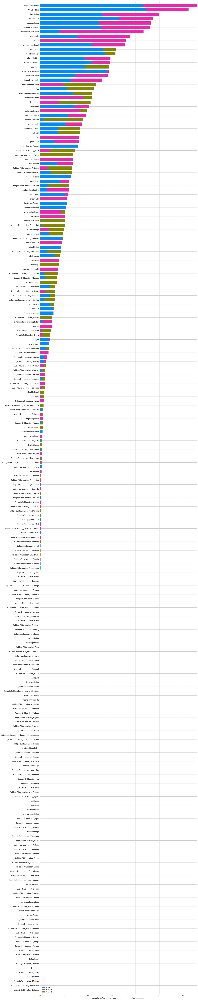

In [223]:
import shap

explainer = shap.LinearExplainer(model_shap, X_train_trans) #LinearExplainer

shap_values = explainer.shap_values(X_test_trans)

shap.summary_plot(shap_values,  max_display=300, feature_names = features, plot_size=(20,100))

# shap numpy 1.20 veya daha düşük versiyonunu ister.

# X_test datası üzerinden aldığımız shap değerleri data_leakege sebep olabileceğinden. shap değerlerini aşağıda train
# datası üzerinden alacağız.

# shap'ın çoğunlukla linear ve treebased modeller ile kullanımı tavsiye edilsede. KNN , SVM gibi non-parametrik modeller içinde
# shap değerleri alabilirsiniz.

# SHAP values for Feature Selection (train data)

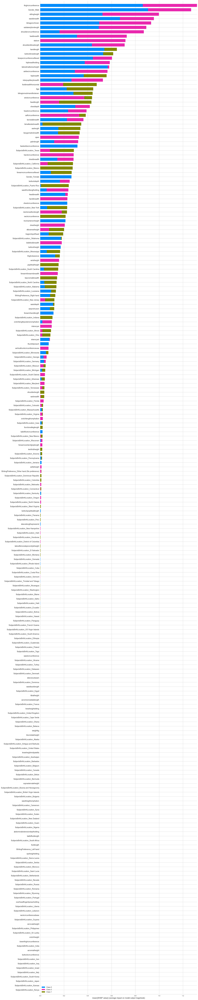

In [224]:
explainer = shap.Explainer(model_shap, X_train_trans)

shap_values = explainer.shap_values(X_train_trans)

shap.summary_plot(shap_values, max_display=300, feature_names = features, plot_size=(20,100))

# maviler black, pembe white ve yeşil hispanic
# gördüğünüz gibi en önemli ilk 13 feature içerisinde hispanic'in tahminine katkı sağlayan feature yok.
# hispaniclerin predictionesine katkısı olan 19 feature seçiyoruz.

In [228]:
hispanic=["SubjectsBirthLocation",  'handlength',  'forearmcircumferenceflexed', "headlength", 'bitragionsubmandibulararc',
          'footbreadthhorizontal',  'bimalleolarbreadth', 'poplitealheight', 'waistdepth', 'WritingPreference', 
          'tragiontopofhead','bideltoidbreadth', 'neckcircumferencebase', 'biacromialbreadth','buttockheight', 
          'buttockkneelength', 'earlength', 'axillaheight', "Age"]

In [229]:
X2 = X[hispanic]
X2.head()

,SubjectsBirthLocation,handlength,forearmcircumferenceflexed,headlength,bitragionsubmandibulararc,footbreadthhorizontal,bimalleolarbreadth,poplitealheight,waistdepth,WritingPreference,tragiontopofhead,bideltoidbreadth,neckcircumferencebase,biacromialbreadth,buttockheight,buttockkneelength,earlength,axillaheight,Age
0,Germany,184,265,191,301,91,65,362,217,Right hand,110,466,368,373,836,587,65,1180,26
1,California,189,247,180,270,91,64,426,168,Right hand,125,430,345,372,900,583,60,1292,21
2,Texas,195,262,207,270,100,69,398,159,Right hand,129,450,369,397,861,583,65,1271,23
3,District of Columbia,186,309,206,294,97,68,394,235,Right hand,125,484,386,384,897,599,62,1250,22
4,Texas,187,260,181,295,88,67,345,300,Right hand,116,525,358,378,811,607,65,1210,45


In [230]:
cat_new = X2.select_dtypes("object").columns
cat_new

Index(['SubjectsBirthLocation', 'WritingPreference'], dtype='object')

In [231]:
X2.shape

(5769, 19)

In [232]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.2, random_state=101, stratify =y)

In [233]:
column_trans_shap = make_column_transformer((OneHotEncoder(handle_unknown="ignore", 
                                                           sparse=False), cat_new), 
                                             remainder=MinMaxScaler(),
                                             verbose_feature_names_out=False)

operations_shap = [("OneHotEncoder",column_trans_shap),
                   ("log", LogisticRegression(class_weight='balanced',
                                              max_iter=10000,
                                              random_state=101,
                                              penalty="l1",
                                              solver='saga'))]

pipe_shap_model = Pipeline(steps=operations_shap)
pipe_shap_model.fit(X_train2, y_train2)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('log',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    penalty='l1', random_state=101,
                                    solver='saga'))])

In [234]:
eval_metric(pipe_shap_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[218   9  33]
 [  7 100  29]
 [ 96 142 520]]
              precision    recall  f1-score   support

       Black       0.68      0.84      0.75       260
    Hispanic       0.40      0.74      0.52       136
       White       0.89      0.69      0.78       758

    accuracy                           0.73      1154
   macro avg       0.66      0.75      0.68      1154
weighted avg       0.79      0.73      0.74      1154


Train_Set
[[ 876   47  115]
 [  34  438   71]
 [ 361  499 2174]]
              precision    recall  f1-score   support

       Black       0.69      0.84      0.76      1038
    Hispanic       0.45      0.81      0.57       543
       White       0.92      0.72      0.81      3034

    accuracy                           0.76      4615
   macro avg       0.69      0.79      0.71      4615
weighted avg       0.81      0.76      0.77      4615



In [235]:
model = Pipeline(steps=operations_shap)

scores = cross_validate(model, 
                        X_train2,
                        y_train2, 
                        scoring=scoring,
                        cv=5,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_precision-hispanik     0.423775
train_precision-hispanik    0.442441
test_recall-hispanik        0.760720
train_recall-hispanik       0.808473
test_f1-hispanik            0.544243
train_f1-hispanik           0.571875
dtype: float64

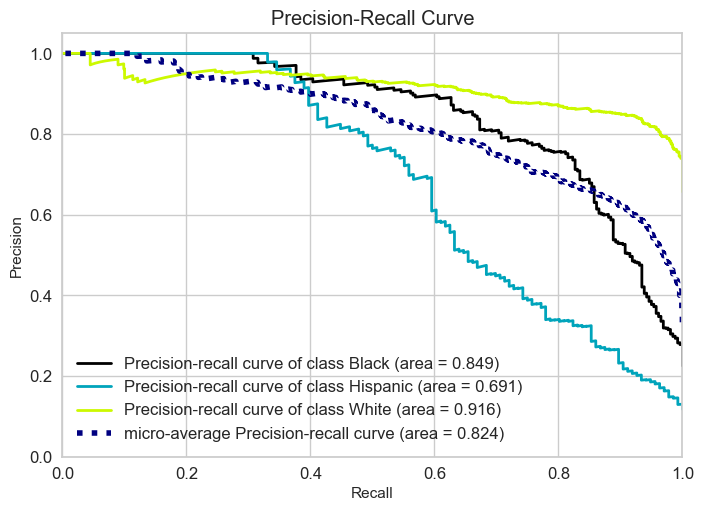

In [236]:
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall


model = Pipeline(steps=operations_shap)

model.fit(X_train2, y_train2)

y_pred_proba = model.predict_proba(X_test2)
    
plot_precision_recall(y_test2, y_pred_proba)
plt.show();

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___